<a href="https://colab.research.google.com/github/mahapara2411/Capstone-2/blob/main/CLV_KPI's.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing the necessary liabraries

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 16.7 MB 35.7 MB/s 
     |████████████████████████████████| 6.3 MB 50.3 MB/s 


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing
import os # manipulate paths
import datetime as dt
from datetime import date # supplies classes for manipulating dates
from time import strftime # convert time to a string as specified by the format argument

import seaborn as sns # to create visualisations
import matplotlib.pyplot as plt
%matplotlib inline
import plotly
import plotly.graph_objects as go
import cufflinks as cf
from matplotlib import pylab
import geopandas

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
cf.go_offline()

import warnings # remove warning messages
warnings.filterwarnings('ignore')

Importing the dataset

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Retail_Dataset.xlsx to Retail_Dataset (1).xlsx


In [ ]:
df = pd.read_excel("Retail_Dataset.xlsx", sheet_name = ["Year 2019-2020", "Year 2020-2021"]) #reading the excel file

In [ ]:
df1 = df["Year 2019-2020"]
df2 = df["Year 2020-2021"]

In [ ]:
df1.shape, df2.shape #checking for the shape of data

((525461, 8), (541910, 8))

In [ ]:
data = df1.append(df2) #combing the data

In [ ]:
data.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2019-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2019-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2019-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2019-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2019-12-01 07:45:00,1.25,13085.0,United Kingdom


**Data Pre-Processing**

In [ ]:
def check_df(dataframe):
    print("################ Shape ####################")
    print(dataframe.shape)
    print("############### Columns ###################")
    print(dataframe.columns)
    print("############### Types #####################")
    print(dataframe.dtypes)
    print("############### Head ######################")
    print(dataframe.head())
    print("############### Tail ######################")
    print(dataframe.tail())
    print("############### Describe ###################")
    print(dataframe.describe().T)

check_df(data)

################ Shape ####################
(1067371, 8)
############### Columns ###################
Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'CustomerID', 'Country'],
      dtype='object')
############### Types #####################
Invoice                object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
Price                 float64
CustomerID            float64
Country                object
dtype: object
############### Head ######################
  Invoice StockCode                          Description  Quantity  \
0  489434     85048  15CM CHRISTMAS GLASS BALL 20 LIGHTS        12   
1  489434    79323P                   PINK CHERRY LIGHTS        12   
2  489434    79323W                  WHITE CHERRY LIGHTS        12   
3  489434     22041         RECORD FRAME 7" SINGLE SIZE         48   
4  489434     21232       STRAWBERRY CERAMIC TRINKET BOX        24   


In [ ]:
# print the basic information: missing values and data types
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1067371 entries, 0 to 541909
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   Invoice      1067371 non-null  object        
 1   StockCode    1067371 non-null  object        
 2   Description  1062989 non-null  object        
 3   Quantity     1067371 non-null  int64         
 4   InvoiceDate  1067371 non-null  datetime64[ns]
 5   Price        1067371 non-null  float64       
 6   CustomerID   824364 non-null   float64       
 7   Country      1067371 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 73.3+ MB


Checking missing values for each column

In [ ]:
data.isnull().sum()/data.shape[0]*100

Invoice         0.000000
StockCode       0.000000
Description     0.410541
Quantity        0.000000
InvoiceDate     0.000000
Price           0.000000
CustomerID     22.766873
Country         0.000000
dtype: float64

In [ ]:
# check out the rows with missing values
# first drop the rows where the description is null
data.dropna(axis = 0, subset = ["Description"], inplace = True)

In [ ]:
data.isnull().sum() #Now let's check the data before droping these customer ID's

Invoice             0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
Price               0
CustomerID     238625
Country             0
dtype: int64

In [ ]:
data[data["CustomerID"].isnull()]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
263,489464,21733,85123a mixed,-96,2019-12-01 10:52:00,0.00,NaN,United Kingdom
283,489463,71477,short,-240,2019-12-01 10:52:00,0.00,NaN,United Kingdom
284,489467,85123A,21733 mixed,-192,2019-12-01 10:53:00,0.00,NaN,United Kingdom
577,489525,85226C,BLUE PULL BACK RACING CAR,1,2019-12-01 11:49:00,0.55,NaN,United Kingdom
578,489525,85227,SET/6 3D KIT CARDS FOR KIDS,1,2019-12-01 11:49:00,0.85,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
541536,581498,85099B,JUMBO BAG RED RETROSPOT,5,2021-12-09 10:26:00,4.13,NaN,United Kingdom
541537,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,2021-12-09 10:26:00,4.13,NaN,United Kingdom
541538,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,2021-12-09 10:26:00,4.96,NaN,United Kingdom
541539,581498,85174,S/4 CACTI CANDLES,1,2021-12-09 10:26:00,10.79,NaN,United Kingdom


In [ ]:
# We have to drop the rows where customer ID is null because it's a unique customer ID of each customer
# So it's better to drop rather than imputing it with some random value

data.dropna(axis = 0, subset = ["CustomerID"], inplace = True)

In [ ]:
data.isnull().sum() #Now's there is no null values available in our data

Invoice        0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
Price          0
CustomerID     0
Country        0
dtype: int64

In [ ]:
df3 = data.copy()
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 824364 entries, 0 to 541909
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Invoice      824364 non-null  object        
 1   StockCode    824364 non-null  object        
 2   Description  824364 non-null  object        
 3   Quantity     824364 non-null  int64         
 4   InvoiceDate  824364 non-null  datetime64[ns]
 5   Price        824364 non-null  float64       
 6   CustomerID   824364 non-null  float64       
 7   Country      824364 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 56.6+ MB


In [ ]:
df3['Quantity'][df3['Quantity']<=0] = None
df3['Quantity'].describe()

count    805620.000000
mean         13.307665
std         144.306739
min           1.000000
25%           2.000000
50%           5.000000
75%          12.000000
max       80995.000000
Name: Quantity, dtype: float64

In [ ]:
df3['Price'][df3['Price']<=0] = None
df3['Price'].describe()

count    824293.000000
mean          3.677116
std          70.244404
min           0.001000
25%           1.250000
50%           1.950000
75%           3.750000
max       38970.000000
Name: Price, dtype: float64

In [ ]:
df3 = df3.dropna()
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 805549 entries, 0 to 541909
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Invoice      805549 non-null  object        
 1   StockCode    805549 non-null  object        
 2   Description  805549 non-null  object        
 3   Quantity     805549 non-null  float64       
 4   InvoiceDate  805549 non-null  datetime64[ns]
 5   Price        805549 non-null  float64       
 6   CustomerID   805549 non-null  float64       
 7   Country      805549 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(4)
memory usage: 55.3+ MB


In [ ]:
df3.duplicated().sum()

26121

In [ ]:
df3.drop_duplicates(inplace=True)
df3.duplicated().sum()

0

In [ ]:
df3.isnull().sum()/df3.shape[0]*100

Invoice        0.0
StockCode      0.0
Description    0.0
Quantity       0.0
InvoiceDate    0.0
Price          0.0
CustomerID     0.0
Country        0.0
dtype: float64

In [ ]:
#exporting the result to csv
df3.to_csv("Retail_cleaned_dataset.csv")

In [ ]:
# print the first 5 rows
df3.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12.0,2019-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48.0,2019-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24.0,2019-12-01 07:45:00,1.25,13085.0,United Kingdom


**Data Cleansing**

In [ ]:
# converting the type of InvoiceDate feature from string to datetime.
df3['InvoiceDate'] = pd.to_datetime(df3['InvoiceDate'])

# creating YearMonth feature to simplify reporting and visualization
df3['InvoiceYearMonth'] = df3['InvoiceDate'].map(lambda date: 100*date.year + date.month).astype('category')

df3.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,InvoiceYearMonth
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12.0,2019-12-01 07:45:00,6.95,13085.0,United Kingdom,201912
1,489434,79323P,PINK CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912
2,489434,79323W,WHITE CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48.0,2019-12-01 07:45:00,2.10,13085.0,United Kingdom,201912
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24.0,2019-12-01 07:45:00,1.25,13085.0,United Kingdom,201912


**Key Performance Indicators (KPIs)**

In [ ]:
# Load file for plotting on world map
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   pop_est     177 non-null    int64   
 1   continent   177 non-null    object  
 2   name        177 non-null    object  
 3   iso_a3      177 non-null    object  
 4   gdp_md_est  177 non-null    float64 
 5   geometry    177 non-null    geometry
dtypes: float64(1), geometry(1), int64(1), object(3)
memory usage: 8.4+ KB


In [ ]:
# Match country names in df3 dataset and world dataframe

Countries = pd.DataFrame(df3.Country.unique(),columns=['Country'])
Countries[~Countries.Country.isin(list(world.name))]

,Country
2,USA
5,EIRE
11,Channel Islands
23,Unspecified
25,Malta
26,RSA
27,Singapore
28,Bahrain
32,West Indies
33,Korea


In [ ]:
# Sync country names in df and world datasets
df3.Country.replace(to_replace={'EIRE':'Ireland','Channel Islands':'United Kingdom','Czech Republic':'Czech Rep.',
                       'RSA':'South Africa','Bahrain':'Saudi Arabia','Malta':'Italy'},inplace=True)
world.name.replace(to_replace={'Malaysia':'Singapore','European community':'EU'},inplace=True)
                       

In [ ]:
def plotOnMap(world,colname,title):
    
    colormap = 'magma_r'
    ax = world.plot(column=colname, cmap=colormap, figsize=[18,12], edgecolor='gray', 
                    vmin=min(world[colname]),vmax=max(world[colname]))

    # map marginal/face deco
    ax.set_title('Distribution of International '+title+' (outside UK)',fontsize=17)
    ax.grid() 

    # colorbar will be created by ...
    fig = ax.get_figure()
    # add colorbar axes to the figure
    # here, need trial-and-error to get [l,b,w,h] right
    # l:left, b:bottom, w:width, h:height; in normalized unit (0-1)
    cbax = fig.add_axes([0.95, 0.3, 0.03, 0.39])   
    cbax.set_title('Number of '+title)

    sm = plt.cm.ScalarMappable(cmap=colormap, \
                    norm=plt.Normalize(vmin=min(world[colname]), vmax=max(world[colname])))
    # at this stage, 
    # 'cbax' is just a blank axes, with un needed labels on x and y axes

    # blank-out the array of the scalar mappable 'sm'
    sm._A = []
    # draw colorbar into 'cbax'
    fig.colorbar(sm, cax=cbax, format="%d")

    # dont use: plt.tight_layout()
    plt.show()
    

In [ ]:
def plotPie(pie_df,colname,title):
    fig = plt.figure(figsize=(5,5))

    colors = ['navajowhite', 'sandybrown']
    plt.pie(pie_df[colname],labels=pie_df.location,autopct='%1.1f%%',colors=colors)
    plt.title(title.title()+' Percentage in UK and outside UK')
    
    plt.tight_layout()
    plt.show()

In [ ]:
def addToWorld(world,col,colname,title):
    '''
    Plots the 'col' values on world map
    ----------------
    Input:
        world: geopandas dataset to be used
        col: column whose count is to be added to the 'world' dataset
        colname: name of the new aggregated column in the 'world' dataset
        title: the measure which is to be plotted
    ----------------
    '''
    if col==None:
        temp_df = df3[df3.CancelledOrder==1].Country.value_counts().to_frame(colname).reset_index()
    else:
        temp_df = df3.groupby(['Country',col],as_index=False).count().Country.value_counts().to_frame(colname).reset_index()
    
    world = pd.merge(world, temp_df, left_on='name', right_on='index', how='left', validate='one_to_one')

    world.drop('index', axis=1, inplace=True)
    world[colname].fillna(0,inplace=True)
    
    temp_df['location'] = np.where(temp_df['index']=='United Kingdom', 'UK', 'Rest of the World')
    pie_df = temp_df.groupby(['location'],as_index=False)[colname].sum()
    plotPie(pie_df,colname,title)
    
    world.loc[world.name=='United Kingdom',colname] = 0
    plotOnMap(world,colname,title)

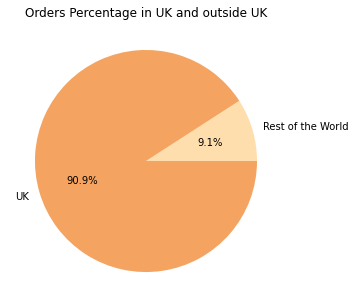

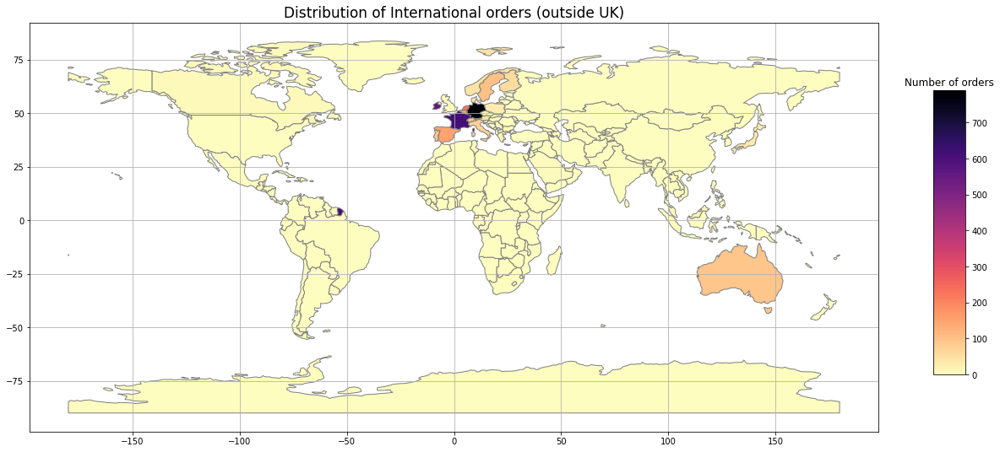

In [ ]:
addToWorld(world,'Invoice','TotalOrders','orders')

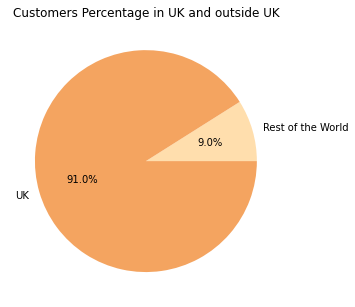

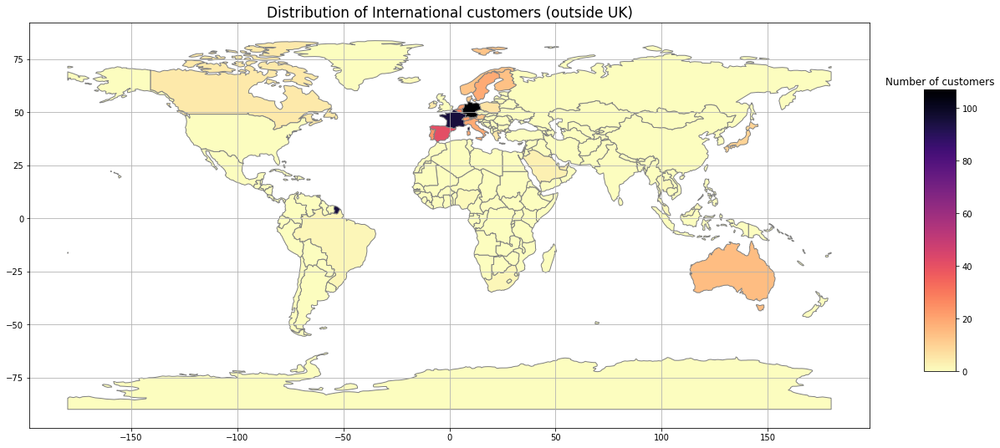

In [ ]:
addToWorld(world,'CustomerID','TotalCust','customers')

In [ ]:
# calculate Revenue for each row
df3['TotalPrice'] = df3['Price'] * df3['Quantity']

# we look at the revenue by country
sales_country = pd.DataFrame(df3.groupby('Country')['TotalPrice'].agg(sum).sort_values(ascending=False)).reset_index()

# plot a bar chart
plot_data = [go.Bar(x=sales_country['Country'],y=sales_country['TotalPrice'])]

plot_layout = go.Layout(title='Sales by Country')

fig = go.Figure(data=plot_data, layout=plot_layout)
fig.show(renderer="colab")

How many orders made by the customers?

In [ ]:
df3.groupby(by=['CustomerID','Country'], as_index=False)['Invoice'].count().head()

,CustomerID,Country,Invoice
0,12346.0,United Kingdom,34
1,12347.0,Iceland,222
2,12348.0,Finland,51
3,12349.0,Italy,175
4,12350.0,Norway,17


Checking TOP 5 highest money spent¶


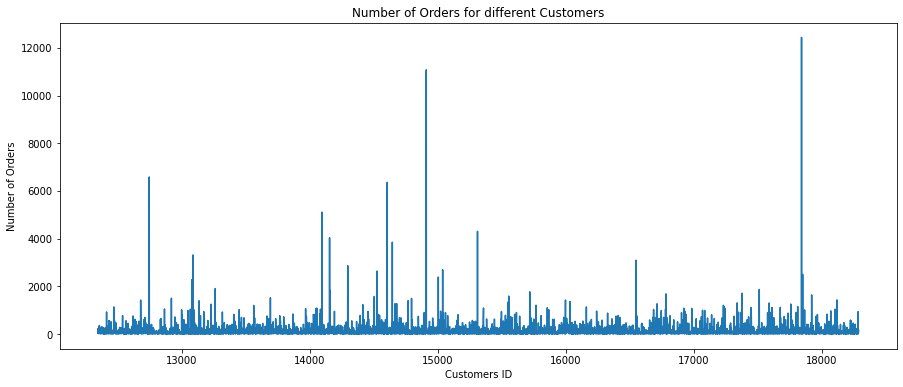

In [ ]:
orders = df3.groupby(by=['CustomerID','Country'], as_index=False)['Invoice'].count()

plt.subplots(figsize=(15,6))
plt.plot(orders.CustomerID, orders.Invoice)
plt.xlabel('Customers ID')
plt.ylabel('Number of Orders')
plt.title('Number of Orders for different Customers')
plt.show()

Checking TOP 5 most number of orders

In [ ]:
print('The TOP 5 customers with most number of orders...')
orders.sort_values(by='Invoice', ascending=False).head()

The TOP 5 customers with most number of orders...


,CustomerID,Country,Invoice
5446,17841.0,United Kingdom,12435
2551,14911.0,Ireland,11077
413,12748.0,United Kingdom,6585
2250,14606.0,United Kingdom,6359
1744,14096.0,United Kingdom,5111


How much money spent by the customers?¶


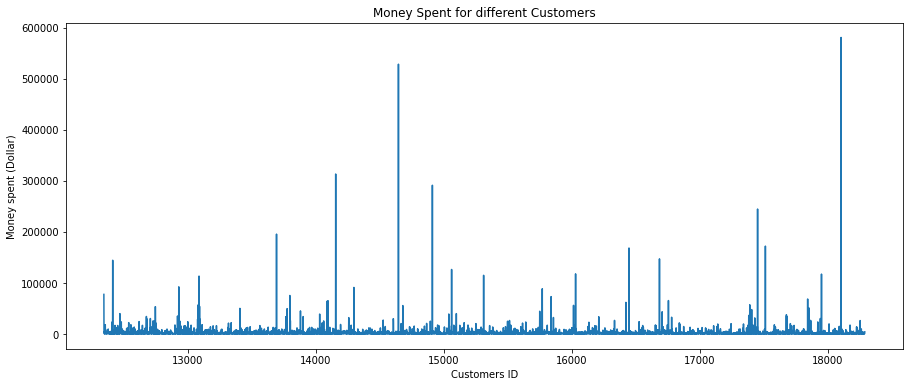

In [ ]:
money_spent = df3.groupby(by=['CustomerID','Country'], as_index=False)['TotalPrice'].sum()

plt.subplots(figsize=(15,6))
plt.plot(money_spent.CustomerID, money_spent.TotalPrice)
plt.xlabel('Customers ID')
plt.ylabel('Money spent (Dollar)')
plt.title('Money Spent for different Customers')
plt.show()

Checking TOP 5 highest money spent


In [ ]:
print('The TOP 5 customers with highest money spent...')
money_spent.sort_values(by='TotalPrice', ascending=False).head()

The TOP 5 customers with highest money spent...


,CustomerID,Country,TotalPrice
5705,18102.0,United Kingdom,580987.04
2290,14646.0,Netherlands,528602.52
1802,14156.0,Ireland,313437.62
2551,14911.0,Ireland,291420.81
5063,17450.0,United Kingdom,244784.25


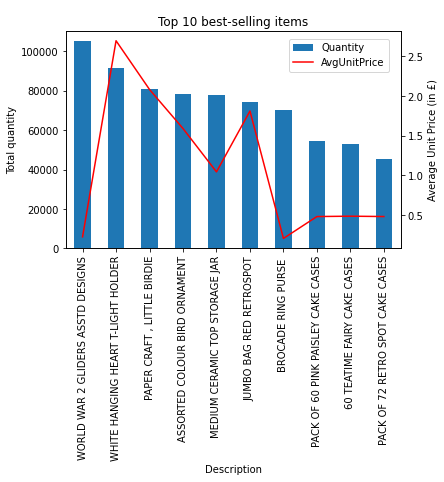

In [ ]:
# Find the 10 best-selling items

Top10Qty = df3.groupby('Description',as_index=False)['Quantity','TotalPrice'].sum().sort_values(by='Quantity',
                                                                                               ascending=False).head(10)
Top10Qty['AvgUnitPrice'] = Top10Qty.TotalPrice/Top10Qty.Quantity

# Plot top 10 most popular items

ax = Top10Qty.plot(x="Description", y="Quantity", legend=False,kind='bar')
ax2 = ax.twinx()
Top10Qty.plot(x="Description", y="AvgUnitPrice", ax=ax2, legend=False, color="r")
ax.figure.legend(loc=(.65,.85))
plt.title('Top 10 best-selling items')
ax.set_ylabel('Total quantity')
ax2.set_ylabel('Average Unit Price (in £)')
plt.show()

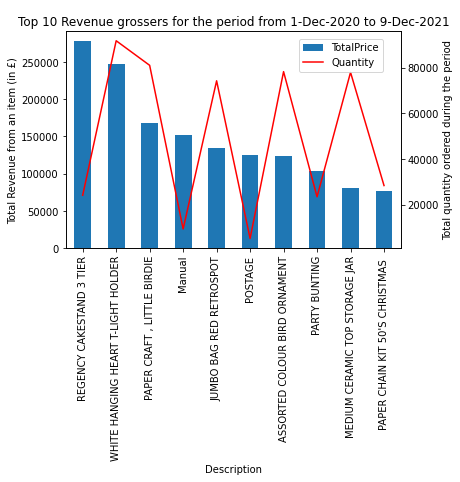

In [ ]:
# Top 10 revenue grossing items

Top10Rev = df3.groupby('Description',as_index=False)['TotalPrice','Quantity'].sum().sort_values(by='TotalPrice',
                                                                                               ascending=False).head(10)
Top10Rev['AvgUnitPrice'] = Top10Rev.TotalPrice/Top10Rev.Quantity

# Total Revenue
TotalRev = round(df3.TotalPrice.sum(),0)

# Plot top 10 revenue grossers
ax = Top10Rev.plot(x="Description", y="TotalPrice", legend=False,kind='bar')
ax2 = ax.twinx()
Top10Rev.plot(x="Description", y="Quantity", ax=ax2, legend=False, color="r")
# ax.axhline(TotalRev, c='k', ls='--')
ax.figure.legend(loc=(.65,.85))
plt.title('Top 10 Revenue grossers for the period from 1-Dec-2020 to 9-Dec-2021')
ax.set_ylabel('Total Revenue from an item (in £)')
ax2.set_ylabel('Total quantity ordered during the period')
plt.show()

In [ ]:
#which customer bought the most number of items?
cust_data=pd.DataFrame()
cust_data['CustomerID']=list(set(data['CustomerID']))
cust_data=cust_data.set_index('CustomerID')
for cust_id in cust_data.index:
    cust_data.at[cust_id,'Number_of_items']=(len(df3[df3['CustomerID']==cust_id]['Description']))
cust_data=cust_data.sort_values('Number_of_items',ascending=False)

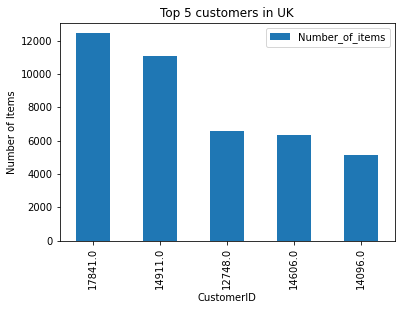

In [ ]:
cust_data.head(5).plot(kind='bar')
plt.ylabel('Number of Items')
plt.title('Top 5 customers in UK')
plt.show()

In [ ]:
df3[df3['Quantity']==df3['Quantity'].describe()['max']] # most bought quantity

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,InvoiceYearMonth,TotalPrice
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995.0,2021-12-09 09:15:00,2.08,16446.0,United Kingdom,202112,168469.6


In [ ]:
temp_data = df3.copy() #creating a data copy point

In [ ]:
temp_data #use the temp data for adding some extra columns to the data

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,InvoiceYearMonth,TotalPrice
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12.0,2019-12-01 07:45:00,6.95,13085.0,United Kingdom,201912,83.40
1,489434,79323P,PINK CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912,81.00
2,489434,79323W,WHITE CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912,81.00
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48.0,2019-12-01 07:45:00,2.10,13085.0,United Kingdom,201912,100.80
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24.0,2019-12-01 07:45:00,1.25,13085.0,United Kingdom,201912,30.00
...,...,...,...,...,...,...,...,...,...,...
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6.0,2021-12-09 12:50:00,2.10,12680.0,France,202112,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4.0,2021-12-09 12:50:00,4.15,12680.0,France,202112,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4.0,2021-12-09 12:50:00,4.15,12680.0,France,202112,16.60
541908,581587,22138,BAKING SET 9 PIECE RETROSPOT,3.0,2021-12-09 12:50:00,4.95,12680.0,France,202112,14.85


In [ ]:
#Date Time Analysis
temp_data.loc[:, "Month"] = df3.InvoiceDate.dt.month
temp_data.loc[:, "Time"] = df3.InvoiceDate.dt.time
temp_data.loc[:, "Year"] = df3.InvoiceDate.dt.year
temp_data.loc[:, "Day"] = df3.InvoiceDate.dt.day
temp_data.loc[:, "Quarter"] = df3.InvoiceDate.dt.quarter
temp_data.loc[:, "Day of Week"] = df3.InvoiceDate.dt.dayofweek

In [ ]:
#Mapping day of week
dayofweek_mapping = dict({0: "Monday", 
                         1: "Tuesday", 
                         2: "Wednesday" , 
                         3: "Thursday", 
                         4: "Friday", 
                         5: "Saturday", 
                         6: "Sunday"})

In [ ]:
#renaming the data values using map function
temp_data["Day of Week"] = temp_data["Day of Week"].map(dayofweek_mapping)

In [ ]:
temp_data.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,InvoiceYearMonth,TotalPrice,Month,Time,Year,Day,Quarter,Day of Week
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12.0,2019-12-01 07:45:00,6.95,13085.0,United Kingdom,201912,83.4,12,07:45:00,2019,1,4,Sunday
1,489434,79323P,PINK CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912,81.0,12,07:45:00,2019,1,4,Sunday
2,489434,79323W,WHITE CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912,81.0,12,07:45:00,2019,1,4,Sunday
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48.0,2019-12-01 07:45:00,2.10,13085.0,United Kingdom,201912,100.8,12,07:45:00,2019,1,4,Sunday
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24.0,2019-12-01 07:45:00,1.25,13085.0,United Kingdom,201912,30.0,12,07:45:00,2019,1,4,Sunday


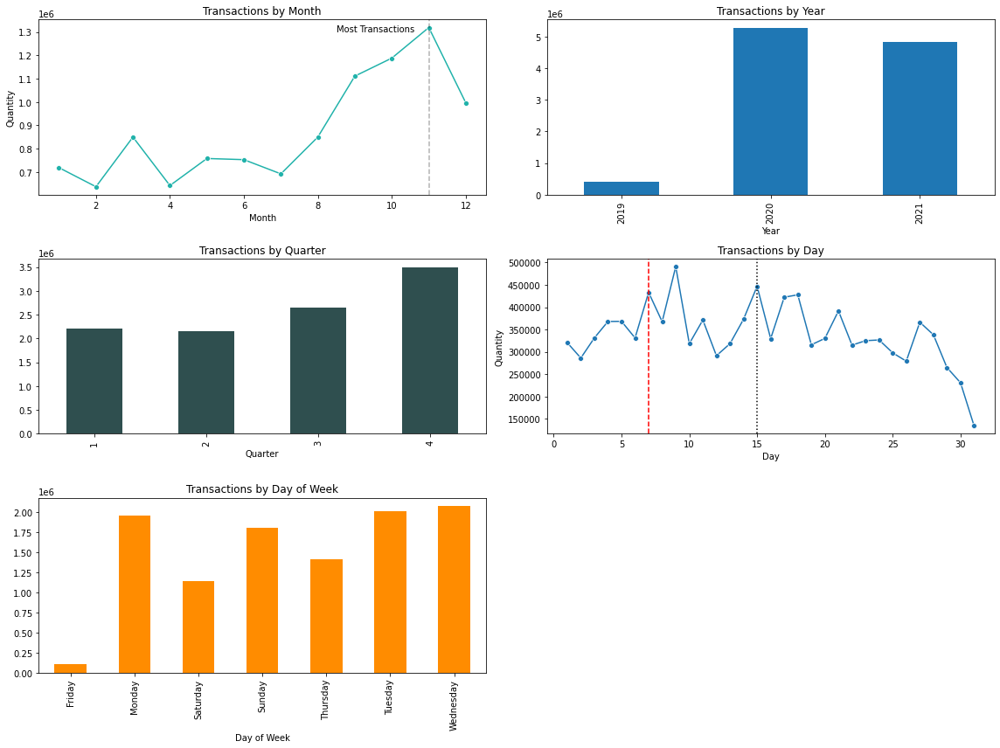

In [ ]:
#Plotting the above data
plt.figure(figsize=(16,12))
plt.subplot(3,2,1)
sns.lineplot(x = "Month", y = "Quantity", data = temp_data.groupby("Month").sum("Quantity"), marker = "o", color = "lightseagreen")
plt.axvline(11, color = "k", linestyle = '--', alpha = 0.3)
plt.text(8.50, 1.3e6, "Most Transactions")
plt.title("Transactions by Month")
plt.subplot(3,2,2)
temp_data.groupby("Year").sum()["Quantity"].plot(kind = "bar")
plt.title("Transactions by Year")
plt.subplot(3,2,3)
temp_data.groupby("Quarter").sum()["Quantity"].plot(kind = "bar", color = "darkslategrey")
plt.title("Transactions by Quarter")
plt.subplot(3,2,4)
sns.lineplot(x = "Day", y = "Quantity", data = temp_data.groupby("Day").sum("Quantity"), marker = "o", )
plt.axvline(7, color = 'r', linestyle = '--')
plt.axvline(15, color = 'k', linestyle = "dotted")
plt.title("Transactions by Day")
plt.subplot(3,2,5)
temp_data.groupby("Day of Week").sum()["Quantity"].plot(kind = "bar", color = "darkorange")
plt.title("Transactions by Day of Week")
plt.tight_layout()
plt.show()

In [ ]:
print("Total Number of Countries in 2019: {}".format(len(temp_data[temp_data["Year"] == 2019]["Country"].unique())))
print("Total Number of Transactions in 2019: {}".format(temp_data[temp_data["Year"] == 2019]["Quantity"].sum()))
print("--------------------------------------------")
print("Total Number of Countries in 2020: {}".format(len(temp_data[temp_data["Year"] == 2020]["Country"].unique())))
print("Total Number of Transactions in 2020: {}".format(temp_data[temp_data["Year"] == 2020]["Quantity"].sum()))
print("--------------------------------------------")
print("Total Number of Countries in 2021: {}".format(len(temp_data[temp_data["Year"] == 2021]["Country"].unique())))
print("Total Number of Transactions in 2021: {}".format(temp_data[temp_data["Year"] == 2021]["Quantity"].sum()))

Total Number of Countries in 2019: 21
Total Number of Transactions in 2019: 398660.0
--------------------------------------------
Total Number of Countries in 2020: 35
Total Number of Transactions in 2020: 5274340.0
--------------------------------------------
Total Number of Countries in 2021: 33
Total Number of Transactions in 2021: 4840955.0


In [ ]:
_2019 = temp_data[temp_data["Year"] == 2019]["Country"].unique()
_2020 = temp_data[temp_data["Year"] == 2020]["Country"].unique()
_2021 = temp_data[temp_data["Year"] == 2021]["Country"].unique()

In [ ]:
#checking for the countries which are available in  2020 and 2021 but not in 2019.

no_cols = []

for i in (_2020):
    if i not in _2019:
        no_cols.append(i)
print("These are the values which are not present in 2019: {}".format(no_cols))

These are the values which are not present in 2019: ['Japan', 'Unspecified', 'Nigeria', 'South Africa', 'Singapore', 'Saudi Arabia', 'Thailand', 'Israel', 'Lithuania', 'West Indies', 'Korea', 'Brazil', 'Canada', 'Iceland']


In [ ]:
temp = data.groupby(["Country", "Description"]).sum()["Quantity"]

In [ ]:
# Number of unique items and customers
print(len(df3.Description.unique()))
print(len(df3.CustomerID.unique()))

5283
5878


**Pareto Principal**

In [ ]:
import plotly 
#plotly.tools.set_credentials_file(username='koshh', api_key='••••••••••')

from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
plotly.offline.init_notebook_mode()

In [ ]:
def applyPareto(df3,column_20, measure):
    '''
    Checks the contribution of 20% of a cause to 80% of sales revenue
     ----------------
    Input:
        df: dataset on which Pareto principle is to be checked
        column_20: column to be checked for 20% of its unique entries to affect 80% of sales
        measure: string - the measure that is conributing to 80%
    ----------------
    '''
    pareto_df = df3.groupby(column_20,as_index=False)['TotalPrice'].sum().sort_values(by='TotalPrice', ascending=False)
    pareto_df['cumulative_sum'] = pareto_df.TotalPrice.cumsum()
    pareto_df['cumulative_perc'] = 100*pareto_df.cumulative_sum/pareto_df.TotalPrice.sum()
    
    item_perc = round(len(pareto_df[(pareto_df.cumulative_perc)<80])/len(pareto_df)*100)

    print(item_perc,'% of',measure,'contribute to 80% of sales')
    print(item_perc,'% means',round(item_perc/100*len(pareto_df)),measure)
    
    plotPareto(pareto_df, column_20,measure)
    
def plotPareto(pareto_df,column_20,measure):
    '''
    Displays applicability of Pareto Principle on a dataset
    '''
    # Graphical representation of Pareto Principle
    pareto_df['demarcation'] = 80
    pareto_threshold = int(len(pareto_df)*.20)


    trace1 = Bar(x=pareto_df[column_20],y=pareto_df.TotalPrice, name='Sales Revenue', marker=dict(color='rgb(34,163,192)'))
    trace2 = Scatter(
        x=pareto_df[column_20],
        y=pareto_df.cumulative_perc,
        name='Cumulative Percentage',
        yaxis='y2',
        line=dict(
            color='rgb(243,158,115)',
            width=2.4
           )
    )
    trace3 = Scatter(
        x=pareto_df[column_20],
        y=pareto_df.demarcation,
        name='80%',
        yaxis='y2',
        line=dict(
            color='rgba(128,128,128,.45)',
            dash = 'dash',
            width=1.5
           )
    )
    trace4 = Scatter(
        x=[pareto_df.head(pareto_threshold).tail(1)[column_20]],
        y=[round(max(pareto_df.TotalPrice))*.90],
        text=['20% of items'],
        mode='text',
    )

    data = [trace1, trace2, trace3, trace4]
    
    layout = Layout(title=measure+'wise sales revenue from 1-Dec-2020 to 9-Dec-2021', 
                    titlefont=dict(color='black', family='Balto, sans-serif', size=12), 
                    font=Font(color='rgb(128,128,128)', family='Balto, sans-serif', size=12), width=1500, height=623, 
                    paper_bgcolor='rgb(240, 240, 240)', plot_bgcolor='rgb(240, 240, 240)', hovermode='closest', 
                    margin=dict(b=250,l=60,r=60,t=65), showlegend=True, 
                    legend=dict(x=.83, y=1.3, font=dict(family='Balto, sans-serif', size=12, color='rgba(128,128,128,.75)'),),
                    annotations=[ dict(text="Cumulative Percentage", showarrow=False, xref="paper", yref="paper", textangle=90, 
                                       x=1.029, y=.75, font=dict(family='Balto, sans-serif', size=14, color='rgba(243,158,115,.9)'),
                                      )], 
                    shapes=[{'type':'line', 'x0':pareto_threshold,'y0':0,'x1':pareto_threshold,'y1':round(max(pareto_df.TotalPrice)),
                             'line':{'color':'rgb(128,128,128,.45)','dash':'dot','width': 1.5}}],
                    xaxis=dict(tickangle=-90), 
                    yaxis=dict(title='Sales (in £)', range=[0,round(max(pareto_df.TotalPrice))], dtick=1,
                                                          tickfont=dict(color='rgba(34,163,192,.75)'),
                                                          tickvals = np.linspace(0,max(round(pareto_df.TotalPrice)),6), 
                                                          titlefont=dict(family='Balto, sans-serif', size=14,
                                                                         color='rgba(34,163,192,.75)'),tickformat='.0f'), 
                    yaxis2=dict(range=[0,101], tickfont=dict(color='rgba(243,158,115,.9)'), tickvals = [0,20,40,60,80,100],
                                overlaying='y', side='right'))

    fig = go.Figure (data=data, layout=layout)
    fig.show(renderer="colab")

In [ ]:
applyPareto(df3,'Description','items')

22 % of items contribute to 80% of sales
22 % means 1162 items


In [ ]:
applyPareto(df3,'CustomerID','customers')

23 % of customers contribute to 80% of sales
23 % means 1352 customers


**Time Series Plot**

**Monthly Revenue**

In [ ]:
# create a new dataframe with YearMonth and TotalPrice columns
sales = df3.groupby(['InvoiceYearMonth'])['TotalPrice'].sum().reset_index()
sales.head()

,InvoiceYearMonth,TotalPrice
0,201912,683504.010
1,202001,555802.672
2,202002,504558.956
3,202003,696978.471
4,202004,591982.002


In [ ]:
# line chart showing the monthly sales
plot_data = [go.Scatter(x=sales['InvoiceYearMonth'],y=sales['TotalPrice'],marker_color='royalblue')]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly sales')

fig = go.Figure(data=plot_data, layout=plot_layout)
fig.show(renderer="colab")

In [ ]:
# calculate the monthly growth
sales['MonthlyGrowth'] = sales['TotalPrice'].pct_change()

sales.head()

,InvoiceYearMonth,TotalPrice,MonthlyGrowth
0,201912,683504.010,NaN
1,202001,555802.672,-0.186833
2,202002,504558.956,-0.092198
3,202003,696978.471,0.381362
4,202004,591982.002,-0.150645


In [ ]:
# bar chart showing the monthly growth rate
sales['positive'] = sales['MonthlyGrowth'] > 0
plot_data = [go.Bar(x=sales.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                    y=round(sales.query("InvoiceYearMonth < 202112")['MonthlyGrowth']*100,2),
                    marker_color=sales.positive.map({True: 'darkgreen', False: 'brown'}))]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly Growth Rate')

fig = go.Figure(data=plot_data, layout=plot_layout)
fig.show(renderer="colab")

**Monthly Active Customers**

In [ ]:
# creating monthly active customers dataframe by counting unique Customer IDs
monthly_active = df3.groupby('InvoiceYearMonth')['CustomerID'].nunique().reset_index()
monthly_active.columns = ['InvoiceYearMonth','ActiveCustomers']

# print the dataframe
monthly_active

,InvoiceYearMonth,ActiveCustomers
0,201912,955
1,202001,720
2,202002,772
3,202003,1057
4,202004,942
5,202005,966
6,202006,1041
7,202007,928
8,202008,911
9,202009,1145


In [ ]:
# bar chart showing monthly active customers
plot_data = [go.Bar(x=monthly_active.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                    y=monthly_active.query("InvoiceYearMonth < 202112")['ActiveCustomers'],
                    marker_color='royalblue')]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly Active Customers')

active_customers = go.Figure(data=plot_data, layout=plot_layout)
active_customers.show(renderer="colab")


# calculate the monthly active customers rate: ACR
monthly_active['ActiveCustomersRate'] = monthly_active['ActiveCustomers'].pct_change()

# bar chart showing the monthly active customers rate
monthly_active['positive'] = monthly_active['ActiveCustomersRate'] > 0
plot_data = [go.Bar(x=monthly_active.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                    y=round(monthly_active.query("InvoiceYearMonth < 202112")['ActiveCustomersRate']*100,2),
                    marker_color=monthly_active.positive.map({True: 'darkgreen', False: 'brown'}))]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly Active Customers Rate')

active_customers_rate = go.Figure(data=plot_data, layout=plot_layout)
active_customers_rate.show(renderer="colab")

**Monthly Order Count**

In [ ]:
# create a new dataframe for number of orders by using InvoiceNo feature
monthly_orders = df3.groupby('InvoiceYearMonth')['Invoice'].nunique().reset_index()
monthly_orders.columns = ['InvoiceYearMonth','Orders']

# print the dataframe
monthly_orders

,InvoiceYearMonth,Orders
0,201912,1512
1,202001,1011
2,202002,1104
3,202003,1524
4,202004,1329
5,202005,1377
6,202006,1497
7,202007,1381
8,202008,1290
9,202009,1689


In [ ]:
# plot showing monthly orders
plot_data = [go.Scatter(x=monthly_orders.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                        y=monthly_orders.query("InvoiceYearMonth < 202112")['Orders'],
                        marker_color='royalblue')]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly Orders')

orders = go.Figure(data=plot_data, layout=plot_layout)
orders.show(renderer="colab")


# calculate the monthly orders rate
monthly_orders['OrdersRate'] = monthly_orders['Orders'].pct_change()

# bar chart showing the monthly orders rate
monthly_orders['positive'] = monthly_orders['OrdersRate'] > 0
plot_data = [go.Bar(x=monthly_orders.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                    y=round(monthly_orders.query("InvoiceYearMonth < 202112")['OrdersRate']*100,2),
                    marker_color=monthly_orders.positive.map({True: 'darkgreen', False: 'brown'}))]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly Orders Rate')

orders_rate = go.Figure(data=plot_data, layout=plot_layout)
orders_rate.show(renderer="colab")

**Average Order Value**

In [ ]:
# create a new dataframe for average average order value
monthly_aov = df3.groupby(['InvoiceYearMonth','Invoice'])['TotalPrice'].sum().reset_index() # group TotalPrice by invoice to get the order value 
monthly_aov = monthly_aov.groupby('InvoiceYearMonth')['TotalPrice'].mean().reset_index() # calculate the average order value
monthly_aov.columns = ['InvoiceYearMonth','AOV']

#print the dataframe
monthly_aov

,InvoiceYearMonth,AOV
0,201912,18.491073
1,202001,15.036324
2,202002,13.650010
3,202003,18.855602
4,202004,16.015096
5,202005,16.173395
6,202006,17.215970
7,202007,15.954339
8,202008,16.292192
9,202009,22.427604


In [ ]:
# plot showing monthly orders

plot_data = [go.Scatter(x=monthly_aov.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                        y=round(monthly_aov.query("InvoiceYearMonth < 202112")['AOV'],2),
                        marker_color='royalblue')]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly AOV')

aov = go.Figure(data=plot_data, layout=plot_layout)
aov.show(renderer="colab")


# calculate the monthly orders rate
monthly_aov['AOVRate'] = monthly_aov['AOV'].pct_change()

# bar chart showing the monthly orders rate
monthly_aov['positive'] = monthly_aov['AOVRate'] > 0
plot_data = [go.Bar(x=monthly_aov.query("InvoiceYearMonth < 202112")['InvoiceYearMonth'],
                    y=round(monthly_aov.query("InvoiceYearMonth < 202112")['AOVRate']*100,2),
                    marker_color=monthly_aov.positive.map({True: 'darkgreen', False: 'brown'}))]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly AOV Rate')

aov_rate = go.Figure(data=plot_data, layout=plot_layout)
aov_rate.show(renderer="colab")

In [ ]:
# create a dataframe contaning CustomerID and first purchase date
first_order = df3.groupby('CustomerID').InvoiceDate.min().reset_index()
first_order.columns = ['CustomerID','FirstOrder']
first_order['FirstOrder'] = first_order['FirstOrder'].map(lambda date: 100*date.year + date.month)

# merge first purchase date column to our main dataframe (df_uk)
df3 = pd.merge(df3, first_order, on='CustomerID')

#create a column called UserType
df3['UserType'] = 'New'
df3.loc[df3.InvoiceYearMonth != df3.FirstOrder,"UserType"] = 'Existing'

df3.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,InvoiceYearMonth,TotalPrice,FirstOrder,UserType
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12.0,2019-12-01 07:45:00,6.95,13085.0,United Kingdom,201912,83.4,201912,New
1,489434,79323P,PINK CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912,81.0,201912,New
2,489434,79323W,WHITE CHERRY LIGHTS,12.0,2019-12-01 07:45:00,6.75,13085.0,United Kingdom,201912,81.0,201912,New
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48.0,2019-12-01 07:45:00,2.10,13085.0,United Kingdom,201912,100.8,201912,New
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24.0,2019-12-01 07:45:00,1.25,13085.0,United Kingdom,201912,30.0,201912,New


In [ ]:
# create a dataframe to show the new customer ratio
new_customer_ratio = df3.query("UserType == 'New'").groupby(['InvoiceYearMonth'])['CustomerID'].nunique()/df3.query("UserType == 'Existing' or UserType == 'New'").groupby(['InvoiceYearMonth'])['CustomerID'].nunique()
new_customer_ratio = new_customer_ratio.reset_index()
new_customer_ratio = new_customer_ratio.dropna()

new_customer_ratio.columns = ['InvoiceYearMonth','NewCustomerRatio']
# print the dafaframe
new_customer_ratio

# plot showing monthly new customer ratio
plot_data = [go.Bar(x=new_customer_ratio.query("InvoiceYearMonth != 201112 and InvoiceYearMonth != 200912")['InvoiceYearMonth'],
                    y=round(new_customer_ratio.query("InvoiceYearMonth != 201112 and InvoiceYearMonth != 200912")['NewCustomerRatio'],2),
                    marker_color='royalblue')]
plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly New Customer Ratio')

ratio = go.Figure(data=plot_data, layout=plot_layout)
ratio.show(renderer="colab")

**New Customer vs Existing Customer Revenue**

In [ ]:
#calculate the revenue per month for each user type
customer_type_revenue = df3.groupby(['InvoiceYearMonth','UserType'])['TotalPrice'].sum().reset_index()

# plot showing monthly new customers vs Existing customers
plot_data = [go.Bar(x=customer_type_revenue.query("InvoiceYearMonth != 201112 and InvoiceYearMonth != 200912 and UserType=='New'")['InvoiceYearMonth'],
                    y=round(customer_type_revenue.query("InvoiceYearMonth != 201112 and InvoiceYearMonth != 200912 and UserType=='New'")['TotalPrice'],2),
                    name='New',
                    marker_color='royalblue'),
            go.Bar(x=customer_type_revenue.query("InvoiceYearMonth != 201112 and InvoiceYearMonth != 200912 and UserType=='Existing'")['InvoiceYearMonth'],
                    y=round(customer_type_revenue.query("InvoiceYearMonth != 201112 and InvoiceYearMonth != 200912 and UserType=='Existing'")['TotalPrice'],2),
                    name='Existing',
                    marker_color='slategrey')]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly New vs Existing Customer Revenue')

avg = go.Figure(data=plot_data, layout=plot_layout)
avg.show(renderer="colab")

In [ ]:
def get_month(x) : return dt.datetime(x.year,x.month,1)
df3['InvoiceYearMonth'] = df3['InvoiceDate'].apply(get_month)
grouping = df3.groupby('CustomerID')['InvoiceYearMonth']
df3['CohortMonth'] = grouping.transform('min')
df3.tail()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,InvoiceYearMonth,TotalPrice,FirstOrder,UserType,CohortMonth
779423,581578,22993,SET OF 4 PANTRY JELLY MOULDS,12.0,2021-12-09 12:16:00,1.25,12713.0,Germany,2021-12-01,15.00,202112,New,2021-12-01
779424,581578,22907,PACK OF 20 NAPKINS PANTRY DESIGN,12.0,2021-12-09 12:16:00,0.85,12713.0,Germany,2021-12-01,10.20,202112,New,2021-12-01
779425,581578,22908,PACK OF 20 NAPKINS RED APPLES,12.0,2021-12-09 12:16:00,0.85,12713.0,Germany,2021-12-01,10.20,202112,New,2021-12-01
779426,581578,23215,JINGLE BELL HEART ANTIQUE SILVER,12.0,2021-12-09 12:16:00,2.08,12713.0,Germany,2021-12-01,24.96,202112,New,2021-12-01
779427,581578,22736,RIBBON REEL MAKING SNOWMEN,10.0,2021-12-09 12:16:00,1.65,12713.0,Germany,2021-12-01,16.50,202112,New,2021-12-01


In [ ]:
def get_month_int (dframe,column):
    year = dframe[column].dt.year
    month = dframe[column].dt.month
    day = dframe[column].dt.day
    return year, month , day 

invoice_year,invoice_month,_ = get_month_int(df3,'InvoiceYearMonth')
cohort_year,cohort_month,_ = get_month_int(df3,'CohortMonth')

year_diff = invoice_year - cohort_year 
month_diff = invoice_month - cohort_month 

df3['CohortIndex'] = year_diff * 12 + month_diff + 1

In [ ]:
#Count monthly active customers from each cohort
grouping = df3.groupby(['CohortMonth', 'CohortIndex'])
cohort_data = grouping['CustomerID'].apply(pd.Series.nunique)
# Return number of unique elements in the object.
cohort_data = cohort_data.reset_index()
cohort_counts = cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values='CustomerID')
cohort_counts

CohortIndex,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
CohortMonth,,,,,,,,,,,,,,,,,,,,,
2019-12-01,955.0,337.0,319.0,406.0,363.0,343.0,360.0,327.0,321.0,346.0,...,289.0,251.0,289.0,270.0,248.0,244.0,301.0,291.0,389.0,188.0
2020-01-01,383.0,79.0,119.0,117.0,101.0,115.0,99.0,88.0,107.0,122.0,...,58.0,90.0,76.0,71.0,75.0,93.0,74.0,94.0,22.0,NaN
2020-02-01,374.0,89.0,84.0,109.0,92.0,75.0,72.0,107.0,95.0,103.0,...,75.0,60.0,61.0,54.0,86.0,86.0,61.0,22.0,NaN,NaN
2020-03-01,443.0,84.0,102.0,107.0,103.0,90.0,109.0,134.0,122.0,48.0,...,75.0,77.0,69.0,78.0,89.0,94.0,35.0,NaN,NaN,NaN
2020-04-01,294.0,57.0,57.0,48.0,54.0,66.0,81.0,77.0,31.0,32.0,...,46.0,41.0,44.0,53.0,66.0,17.0,NaN,NaN,NaN,NaN
2020-05-01,254.0,40.0,43.0,44.0,45.0,65.0,54.0,32.0,15.0,21.0,...,32.0,35.0,42.0,39.0,12.0,NaN,NaN,NaN,NaN,NaN
2020-06-01,270.0,47.0,51.0,55.0,62.0,77.0,34.0,24.0,22.0,32.0,...,33.0,36.0,55.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-01,186.0,29.0,34.0,55.0,54.0,26.0,21.0,27.0,27.0,21.0,...,32.0,44.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-01,162.0,33.0,48.0,52.0,28.0,19.0,16.0,20.0,22.0,21.0,...,32.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Retention table
cohort_size = cohort_counts.iloc[:,0]
retention = cohort_counts.divide(cohort_size,axis=0) #axis=0 to ensure the divide along the row axis 
retention.round(3) * 100 #to show the number as percentage

CohortIndex,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,25
CohortMonth,,,,,,,,,,,,,,,,,,,,,
2019-12-01,100.0,35.3,33.4,42.5,38.0,35.9,37.7,34.2,33.6,36.2,...,30.3,26.3,30.3,28.3,26.0,25.5,31.5,30.5,40.7,19.7
2020-01-01,100.0,20.6,31.1,30.5,26.4,30.0,25.8,23.0,27.9,31.9,...,15.1,23.5,19.8,18.5,19.6,24.3,19.3,24.5,5.7,NaN
2020-02-01,100.0,23.8,22.5,29.1,24.6,20.1,19.3,28.6,25.4,27.5,...,20.1,16.0,16.3,14.4,23.0,23.0,16.3,5.9,NaN,NaN
2020-03-01,100.0,19.0,23.0,24.2,23.3,20.3,24.6,30.2,27.5,10.8,...,16.9,17.4,15.6,17.6,20.1,21.2,7.9,NaN,NaN,NaN
2020-04-01,100.0,19.4,19.4,16.3,18.4,22.4,27.6,26.2,10.5,10.9,...,15.6,13.9,15.0,18.0,22.4,5.8,NaN,NaN,NaN,NaN
2020-05-01,100.0,15.7,16.9,17.3,17.7,25.6,21.3,12.6,5.9,8.3,...,12.6,13.8,16.5,15.4,4.7,NaN,NaN,NaN,NaN,NaN
2020-06-01,100.0,17.4,18.9,20.4,23.0,28.5,12.6,8.9,8.1,11.9,...,12.2,13.3,20.4,5.2,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-01,100.0,15.6,18.3,29.6,29.0,14.0,11.3,14.5,14.5,11.3,...,17.2,23.7,8.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-01,100.0,20.4,29.6,32.1,17.3,11.7,9.9,12.3,13.6,13.0,...,19.8,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


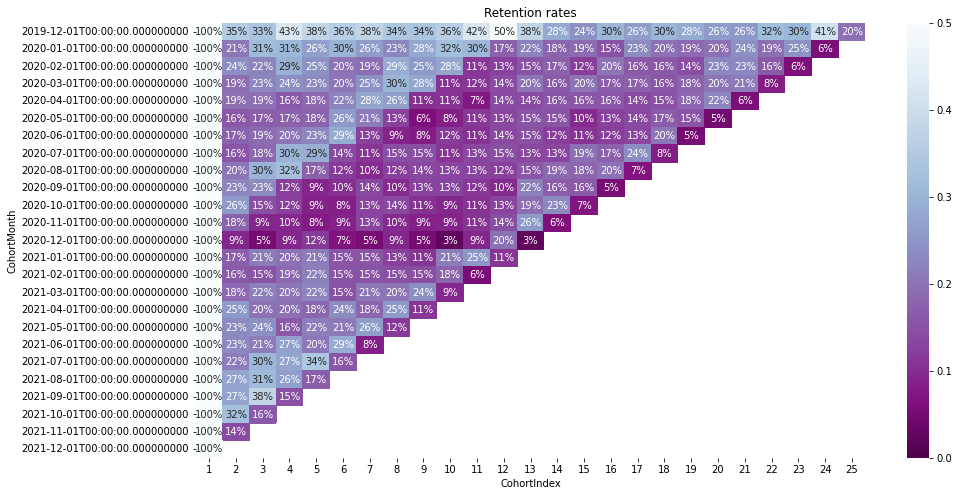

In [ ]:
#Build the heatmap
plt.figure(figsize=(15, 8))
plt.title('Retention rates')
sns.heatmap(data=retention,annot = True,fmt = '.0%',vmin = 0.0,vmax = 0.5,cmap="BuPu_r")
plt.show()

In [ ]:
# identify which customers are active by looking at their revenue per month
customer_purchase = df3.groupby(['CustomerID','InvoiceYearMonth'])['TotalPrice'].sum().dropna().reset_index()
customer_purchase['CustomerID'] = customer_purchase['CustomerID'].astype(int).astype('category')
customer_purchase

# change customer_purchase from long to wide dataframe
df_retention = pd.crosstab(customer_purchase['CustomerID'], customer_purchase['InvoiceYearMonth'].astype(str), dropna=False).reset_index()
df_retention.head()

InvoiceYearMonth,CustomerID,2019-12-01,2020-01-01,2020-02-01,2020-03-01,2020-04-01,2020-05-01,2020-06-01,2020-07-01,2020-08-01,...,2021-03-01,2021-04-01,2021-05-01,2021-06-01,2021-07-01,2021-08-01,2021-09-01,2021-10-01,2021-11-01,2021-12-01
0,12346,1,1,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,12347,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,1,0,1,0,1
2,12348,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
3,12349,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,12350,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# count of total customers each months
total_customers = {}

for column in df_retention.loc[:, df_retention.columns != 'CustomerID'].columns:
    # count the total number of customers for each months
    TotalCustomers = df_retention[column].sum()
    # store the results
    total_customers[column] = (TotalCustomers)

# create a data frame
total_customers = pd.DataFrame(total_customers.items(), columns=['InvoiceYearMonth', 'TotalCustomers'])
total_customers 

,InvoiceYearMonth,TotalCustomers
0,2019-12-01,955
1,2020-01-01,720
2,2020-02-01,772
3,2020-03-01,1057
4,2020-04-01,942
5,2020-05-01,966
6,2020-06-01,1041
7,2020-07-01,928
8,2020-08-01,911
9,2020-09-01,1145


In [ ]:
# count of total returning customers each months
returning_customers = {}

for i in range(0,12,1):
    # count the total number of returning customers for each months
    columns_selection = df_retention.iloc[:, (1+i):(3+i)]
    ReturningCustomers = np.where((columns_selection.iloc[:, 0] == 1) & (columns_selection.iloc[:, 1] == 1), 1, 0)
    # store the results
    returning_customers[i] = (ReturningCustomers.sum())
    
    
# create a data frame
returning_customers = pd.DataFrame(returning_customers.items(), columns=['index', 'ReturningCustomers']).drop(['index'], axis=1)
# create a row to account for the month of December 2010
new_row = pd.DataFrame({'ReturningCustomers': [np.nan]})
# add the new row to retention dataframe 
returning_customers = pd.concat([new_row, returning_customers]).reset_index(drop = True) 
returning_customers

,ReturningCustomers
0,NaN
1,337.0
2,262.0
3,314.0
4,378.0
5,345.0
6,368.0
7,392.0
8,351.0
9,365.0


In [ ]:
# add the total number of customers ech month to the retention dataframe
retention = pd.merge(total_customers, returning_customers, left_index=True, right_index=True)

# calculate the retention rate
retention['RetentionRate'] = retention['ReturningCustomers']/retention['TotalCustomers']

retention

,InvoiceYearMonth,TotalCustomers,ReturningCustomers,RetentionRate
0,2019-12-01,955,NaN,NaN
1,2020-01-01,720,337.0,0.468056
2,2020-02-01,772,262.0,0.339378
3,2020-03-01,1057,314.0,0.297067
4,2020-04-01,942,378.0,0.401274
5,2020-05-01,966,345.0,0.357143
6,2020-06-01,1041,368.0,0.353506
7,2020-07-01,928,392.0,0.422414
8,2020-08-01,911,351.0,0.385291
9,2020-09-01,1145,365.0,0.318777


In [ ]:
# plot showing monthly retention rate
plot_data = [go.Scatter(x=retention.query("InvoiceYearMonth != '201112' and InvoiceYearMonth != '200912'")['InvoiceYearMonth'],
                        y=round(retention.query("InvoiceYearMonth != '201112' and InvoiceYearMonth != '200912'")['RetentionRate'],2),
                        marker_color='royalblue')]

plot_layout = go.Layout(xaxis={"type": "category"},title='Monthly Retention Rate')

customer_retention = go.Figure(data=plot_data, layout=plot_layout)
customer_retention.show(renderer="colab")

**Retention by cohort**

In [ ]:
# define the cohort_period function
def cohort_period(df):
    """
    Creates a `CohortPeriod` column, which is the Nth period based on the cutsomer's first order.
    
    Example
    -------
    Get the 3rd month for every customer:
        df.sort(['CustomerID', 'InvoiceNo', inplace=True)
        df = df.groupby('CustomerID').apply(cohort_period)
        df[df.CohortPeriod == 3]
    """
    df['CohortPeriod'] = np.arange(len(df)) + 1
    return df

In [ ]:
# creating a new dataframe grouped by FirstOrder and InvoiceYearMonth 
df_cohort = df3.groupby(['FirstOrder','InvoiceYearMonth'])

# count the unique customerID
df_cohort = df_cohort.agg({'CustomerID': pd.Series.nunique})

# make the column name more meaningful
df_cohort.rename(columns={'CustomerID': 'Nb_Customers'}, inplace=True)

# apply the cohort_period() function to df_cohort
df_cohort = df_cohort.groupby(level=0).apply(cohort_period)
df_cohort.head

<bound method NDFrame.head of                              Nb_Customers  CohortPeriod
FirstOrder InvoiceYearMonth                            
201912     2019-12-01                 955             1
           2020-01-01                 337             2
           2020-02-01                 319             3
           2020-03-01                 406             4
           2020-04-01                 363             5
...                                   ...           ...
202110     2021-11-01                  71             2
           2021-12-01                  35             3
202111     2021-11-01                 191             1
           2021-12-01                  27             2
202112     2021-12-01                  28             1

[325 rows x 2 columns]>

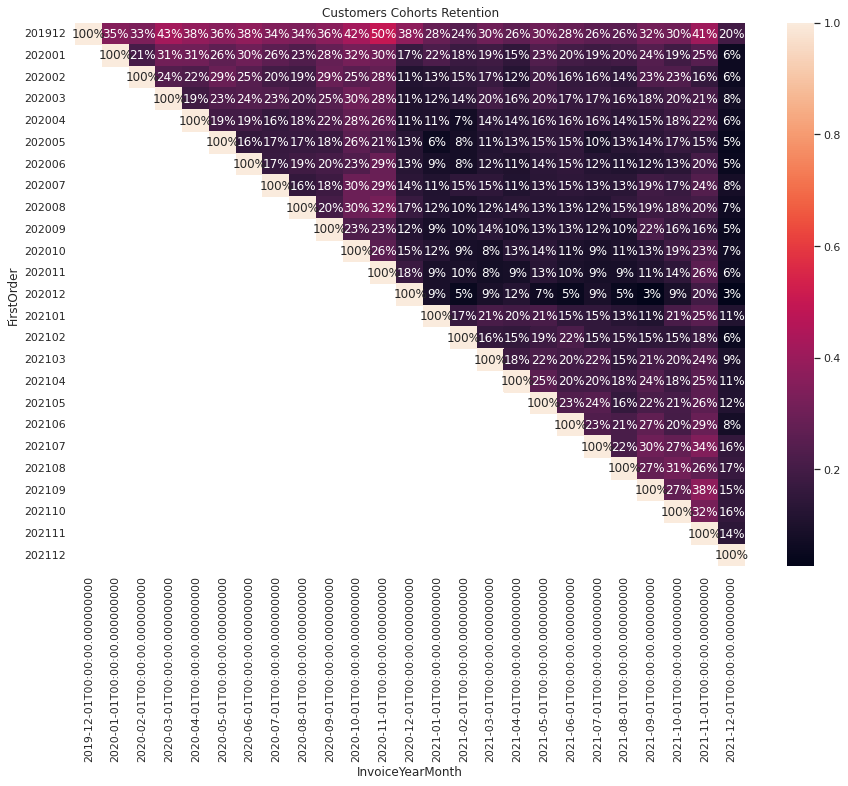

In [ ]:
# create cohort based retention table
cohorts = df_cohort['Nb_Customers'].unstack(0)

# create a serie holding the total number of customers for each CohortGroup
cohort_group_size = df_cohort['Nb_Customers'].groupby(level=0).first()

# create a new dataframe containing the percentage of customers from the cohort purchasing within the given period
cohort_retention = df_cohort['Nb_Customers'].unstack(0).divide(cohort_group_size, axis=1)

# plot showing cohort retention rate
sns.set(style='white')
plt.figure(figsize=(15, 10))
plt.title('Customers Cohorts Retention')
sns.heatmap(cohort_retention.T, mask=cohort_retention.T.isnull(), annot=True, fmt='.0%')

**Average quantity for each cohort**

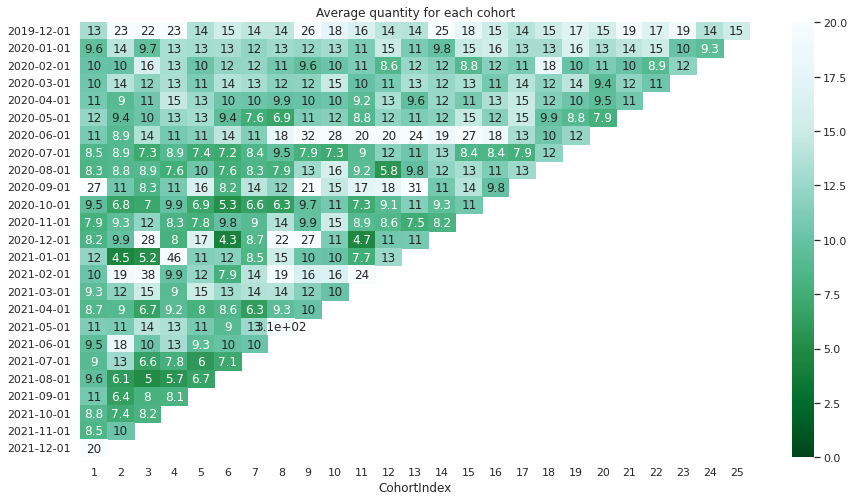

In [ ]:
#Average quantity for each cohort
grouping = df3.groupby(['CohortMonth', 'CohortIndex'])
cohort_data = grouping['Quantity'].mean()
cohort_data = cohort_data.reset_index()
average_quantity = cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values='Quantity')
average_quantity.round(1)
average_quantity.index = average_quantity.index.date

#Build the heatmap
plt.figure(figsize=(15, 8))
plt.title('Average quantity for each cohort')
sns.heatmap(data=average_quantity,annot = True,vmin = 0.0,vmax =20,cmap="BuGn_r")
plt.show()